In [1]:
# Install necessary libraries
!pip install opencv-python-headless tensorflow pandas numpy matplotlib seaborn scikit-learn

In [2]:
import pandas as pd
import os
import json
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

# Define paths
photo_path = "C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos"
photos_json_path = photos_json_path = "C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos.json"# Adjust the path to your JSON file

# Load JSON data (replace this with the actual JSON structure)
photos_df = pd.read_json(photos_json_path, lines=True)

# Inspect the first few rows
print(photos_df.head())

                 photo_id             business_id  \
0  zsvj7vloL4L5jhYyPIuVwg  Nk-SJhPlDBkAZvfsADtccA   
1  HCUdRJHHm_e0OCTlZetGLg  yVZtL5MmrpiivyCIrVkGgA   
2  vkr8T0scuJmGVvN2HJelEA  _ab50qdWOk0DdB6XOrBitw   
3  pve7D6NUrafHW3EAORubyw  SZU9c8V2GuREDN5KgyHFJw   
4  H52Er-uBg6rNrHcReWTD2w  Gzur0f0XMkrVxIwYJvOt2g   

                                             caption    label  
0  Nice rock artwork everywhere and craploads of ...   inside  
1                                                     outside  
2                                     oyster shooter    drink  
3                                      Shrimp scampi     food  
4                                                        food  


In [3]:
photos_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200100 entries, 0 to 200099
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   photo_id     200100 non-null  object
 1   business_id  200100 non-null  object
 2   caption      200100 non-null  object
 3   label        200100 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


In [4]:
photos_df['label' ].unique() 

array(['inside', 'outside', 'drink', 'food', 'menu'], dtype=object)

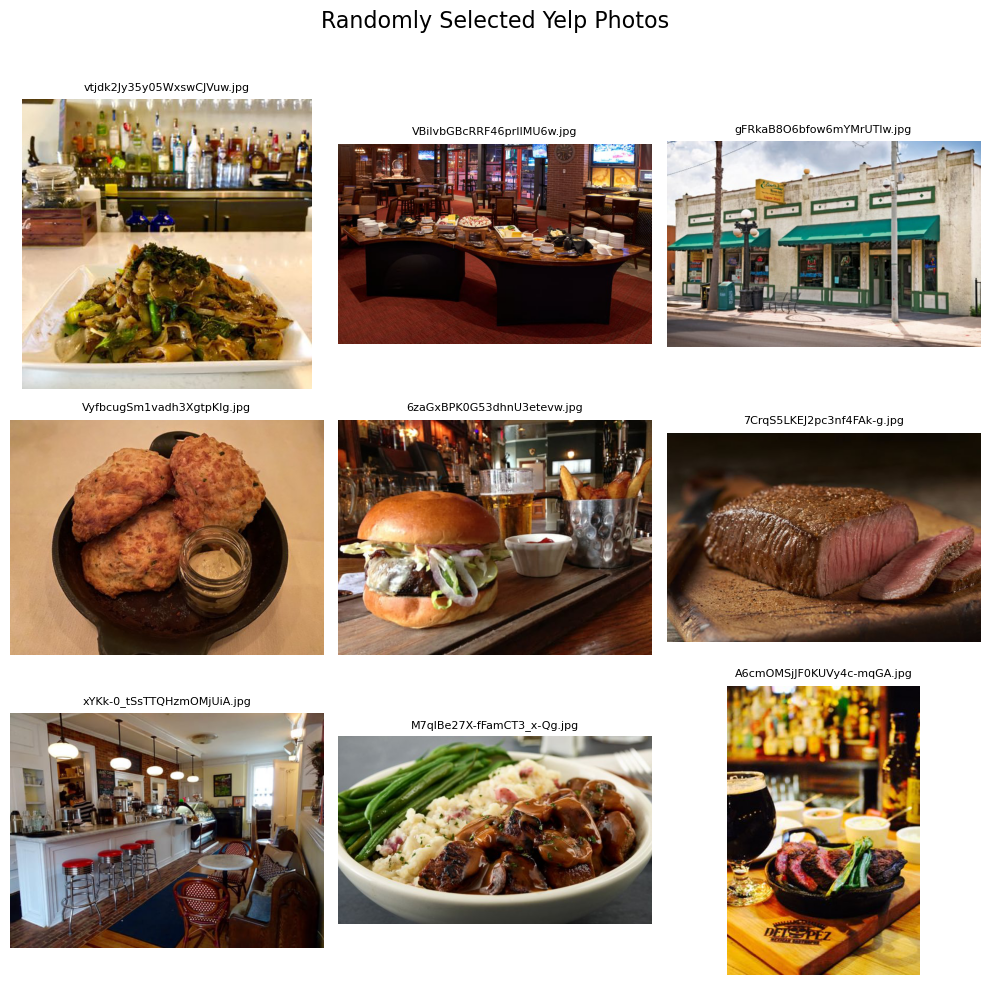

In [5]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Path to the folder containing the photos
photos_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos'

# Get a list of all files in the folder
all_photos = os.listdir(photos_folder)

# Filter out non-image files (optional, if needed)
image_files = [f for f in all_photos if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pick 9 random images from the list
selected_photos = random.sample(image_files, 9)

# Create a 3x3 grid to display images
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle("Randomly Selected Yelp Photos", fontsize=16)

# Loop through the selected photos and display them
for i, photo in enumerate(selected_photos):
    # Get the full path of the image
    img_path = os.path.join(photos_folder, photo)
    img = Image.open(img_path)  # Open the image
    
    # Calculate the row and column to place the image in
    row, col = divmod(i, 3)
    
    # Display the image
    axes[row, col].imshow(img)
    axes[row, col].axis('off')  # Hide axes
    axes[row, col].set_title(photo, fontsize=8)  # Set the title of the image

# Adjust layout to prevent overlap of titles and images
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot with the images
plt.show()

C:\Users\GINE\AppData\Local\Temp\ipykernel_17392\447046137.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab20", len(label_counts))  # Using a colormap (tab20) for distinct colors


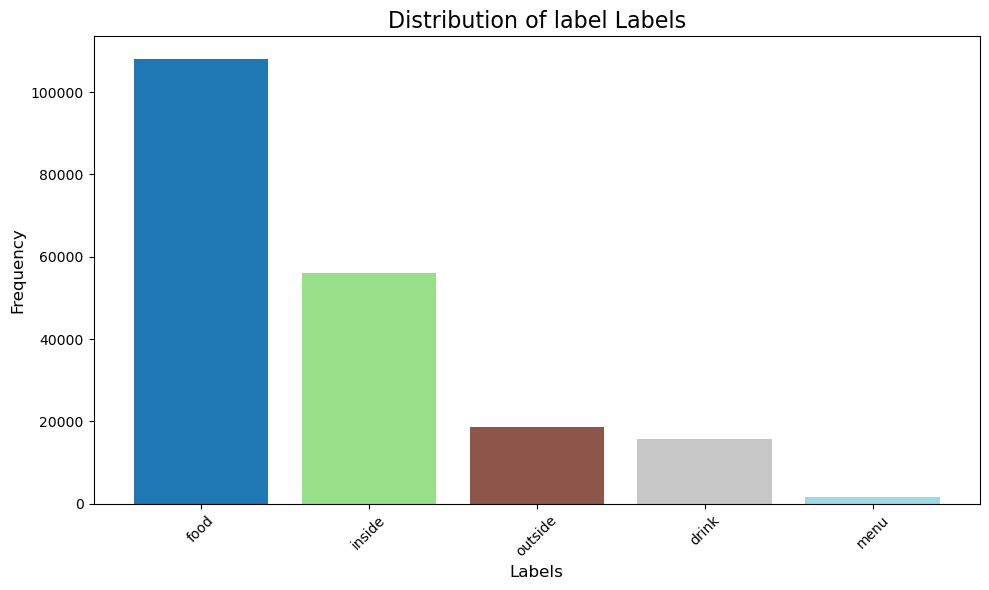

In [117]:
# Check the column names to identify the labels (assuming the column is named 'label' or similar)
if 'category' in photos_df.columns:
    label_column = 'category'
elif 'label' in photos_df.columns:
    label_column = 'label'
else:
    raise ValueError("The JSON file does not contain a label column.")

# Count the occurrences of each label
label_counts = photos_df[label_column].value_counts()

# Generate a list of unique colors (one for each bar)
colors = plt.cm.get_cmap("tab20", len(label_counts))  # Using a colormap (tab20) for distinct colors
color_list = [colors(i) for i in range(len(label_counts))]

# Plot the label distribution with different colors for each bar
plt.figure(figsize=(10, 6))
bars = plt.bar(label_counts.index, label_counts.values, color=color_list)

# Add title and labels
plt.title(f"Distribution of {label_column} Labels", fontsize=16)
plt.xlabel("Labels", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()

In [6]:
from sklearn.model_selection import train_test_split

sampled_data_list, _ = train_test_split(photos_df, test_size=0.9, stratify=photos_df['label'])

# Convert the sampled dataframe to a list of dictionaries (assuming you want to keep photo_id)
sampled_data_list = sampled_data_list[['photo_id']].to_dict(orient='records')

print(f"Sampled data contains {len(sampled_data_list)} entries.")

Sampled data contains 20010 entries.


In [7]:
import os
import cv2

# Target size for resizing images
TARGET_SIZE = (64, 64)

# Folder where the resized images will be saved
resized_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/photos/preprocessed_photos_resized'

# Create the folder if it doesn't exist
os.makedirs(resized_folder, exist_ok=True)

# Loop through each entry in the data (replace 'sampled_data_list' with your actual data)
for entry in sampled_data_list:
    try:
        # Extract the photo ID and construct the image path
        photo_id = entry['photo_id']
        img_path = os.path.join(photos_folder, photo_id + '.jpg')

        # Load the image in original color
        img = cv2.imread(img_path)

        if img is None:
            print(f"Unreadable image: {img_path}")
            continue

        # Resize the image
        img_resized = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)

        # Save the resized image
        save_path = os.path.join(resized_folder, photo_id + '.jpg')
        cv2.imwrite(save_path, img_resized)

    except Exception as e:
        print(f"Error processing {img_path}: {e}")

print("Resizing completed and images saved.")


Unreadable image: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos\DB7BlUpO4LAmC1lCN62hqg.jpg
Unreadable image: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos\w5ABnSadHC8z1lthMQBaBQ.jpg
Unreadable image: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos\5q-sAvIPl0yNeuAbNBPM1g.jpg
Unreadable image: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos\UG2JuFFa_WxhPEtMOtq-JQ.jpg
Unreadable image: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos\l_rMdwgrvjm2PyHyXBcBTw.jpg
Unreadable image: C:/Users/GINE/OneDrive - Loyalis

In [9]:
# import os
import cv2

# List to store IDs of corrupted or unreadable images
corrupted_ids = []

# Folder containing resized images (input)
resized_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/photos/preprocessed_photos_resized'

# Folder to save thresholded images (output)
preprocessed_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos'
os.makedirs(preprocessed_folder, exist_ok=True)

# Loop through each image in sampled_data_list
for entry in sampled_data_list[:]:  # Use a copy to avoid modifying the list while iterating
    photo_id = entry['photo_id']
    img_path = os.path.join(resized_folder, photo_id + '.jpg')

    try:
        # Load image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # Check if the image loaded properly
        if img is None:
            raise ValueError(f"Unreadable image: {img_path}")

        # Normalize pixel intensities to range [0, 255]
        img_normalized = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)

        # Apply binary thresholding with threshold value 128
        _, img_thresholded = cv2.threshold(img_normalized, 128, 255, cv2.THRESH_BINARY)

        # Construct the save path
        save_path = os.path.join(preprocessed_folder, photo_id + '_thresholded.jpg')

        # Save the thresholded image if it's valid
        if img_thresholded is not None and img_thresholded.size > 0:
            result = cv2.imwrite(save_path, img_thresholded)
            if result:
                print(f"Image saved: {save_path}")
            else:
                print(f"Failed to save image: {save_path}")
        else:
            print(f"Thresholded image is empty: {save_path}")

    except Exception as e:
        print(f"Corrupted image detected: {img_path} - Error: {e}")
        corrupted_ids.append(photo_id)

# Filter out corrupted entries from the list
sampled_data_list = [entry for entry in sampled_data_list if entry['photo_id'] not in corrupted_ids]

# Print final summary
print(f"Removed {len(corrupted_ids)} corrupted images.")
print("Intensity thresholding completed and images saved.")

Image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos\6M_sDLZRh6QW4L2olRKK5Q_thresholded.jpg
Image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos\81rMH0EFX8AWPu8EuzNEhA_thresholded.jpg
Image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos\fiCOJdwop4hZw0I0Sdsf3Q_thresholded.jpg
Image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos\ui3Eo826uozkXPJCErunyA_thresholded.jpg
Image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos\YbeMdPHrMV_qrkEg-C-FfA_thresholded.jpg
Image save

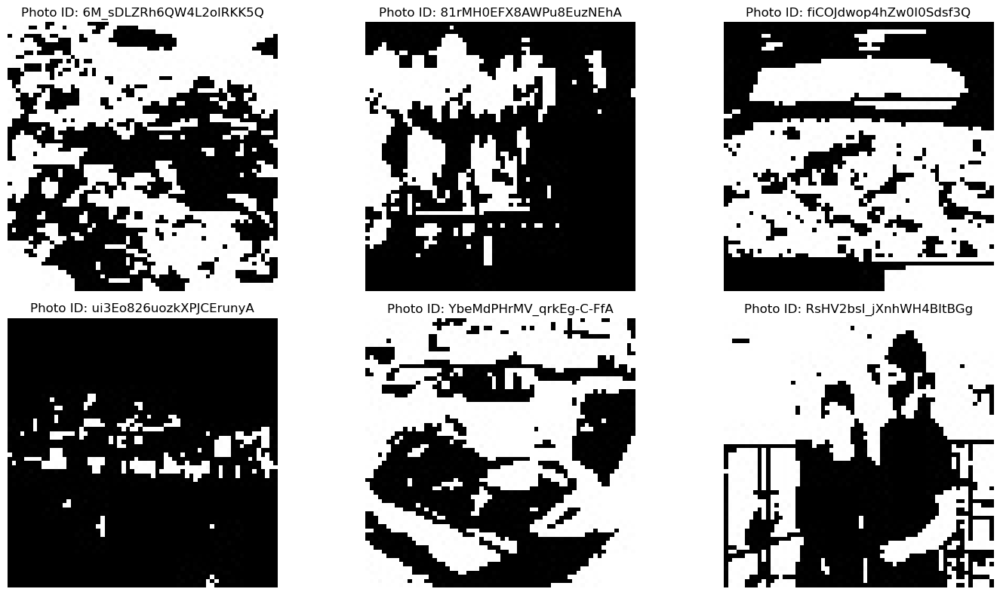

In [10]:
import os
import cv2
import matplotlib.pyplot as plt

# Folder where equalized images are stored
pre_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos'

# Set up plot for displaying 6 images
plt.figure(figsize=(15, 8))  # Adjust size as needed

# Show first 6 images from the list
for i, entry in enumerate(sampled_data_list[:6]):
    photo_id = entry['photo_id']
    img_path = os.path.join(pre_folder, photo_id + '_thresholded.jpg')

    # Load image
    img = cv2.imread(img_path)

    if img is not None:
        plt.subplot(2, 3, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Photo ID: {photo_id}")
        plt.axis('off')
    else:
        print(f"Could not load image: {img_path}")

plt.tight_layout()
plt.show()


In [11]:
import os
import cv2

# Define the folder path containing thresholded images
preprocessed_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/preprocessed_photos'
equalized_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder'

os.makedirs(equalized_folder, exist_ok=True)

# Apply histogram equalization to all thresholded images
for entry in sampled_data_list:
    photo_id = entry['photo_id']
    img_path = os.path.join(preprocessed_folder, photo_id + '_thresholded.jpg')

    try:
        # Read the thresholded image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # Validate image
        if img is None:
            raise ValueError(f"Unreadable image: {img_path}")

        # Apply histogram equalization
        img_equalized = cv2.equalizeHist(img)

        # Define the path to save the equalized image
        save_path = os.path.join(equalized_folder, photo_id + '_equalized.jpg')

        # Save the equalized image
        result = cv2.imwrite(save_path, img_equalized)
        if result:
            print(f"Equalized image saved: {save_path}")
        else:
            print(f"Failed to save equalized image: {save_path}")

    except Exception as e:
        print(f"Error processing {img_path}: {e}")

print("Histogram equalization completed and images saved.")

Equalized image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder\6M_sDLZRh6QW4L2olRKK5Q_equalized.jpg
Equalized image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder\81rMH0EFX8AWPu8EuzNEhA_equalized.jpg
Equalized image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder\fiCOJdwop4hZw0I0Sdsf3Q_equalized.jpg
Equalized image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder\ui3Eo826uozkXPJCErunyA_equalized.jpg
Equalized image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder\YbeMdPHrMV_qrkEg-C-FfA

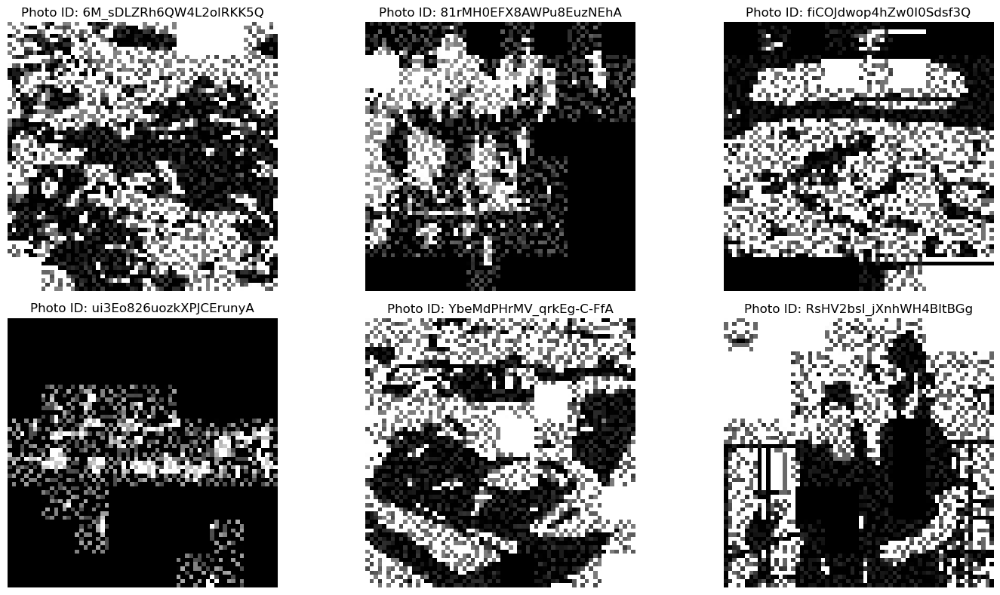

In [12]:
import os
import cv2
import matplotlib.pyplot as plt

# Folder where equalized images are stored
equalized_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder'

# Set up plot for displaying 6 images
plt.figure(figsize=(15, 8))  # Adjust size as needed

# Show first 6 images from the list
for i, entry in enumerate(sampled_data_list[:6]):
    photo_id = entry['photo_id']
    img_path = os.path.join(equalized_folder, photo_id + '_equalized.jpg')

    # Load image
    img = cv2.imread(img_path)

    if img is not None:
        plt.subplot(2, 3, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Photo ID: {photo_id}")
        plt.axis('off')
    else:
        print(f"Could not load image: {img_path}")

plt.tight_layout()
plt.show()


In [13]:
import os
import cv2

# Define folders
equalized_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/equalized_folder'
blurred_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder'

# Create output folder if it doesn't exist
os.makedirs(blurred_folder, exist_ok=True)

# Apply Gaussian Blur to all equalized images
for entry in sampled_data_list:
    photo_id = entry['photo_id']
    img_path = os.path.join(equalized_folder, photo_id + '_equalized.jpg')

    try:
        if not os.path.exists(img_path):
            print(f"Equalized image missing: {img_path}")
            continue

        # Read the equalized image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # Validate image
        if img is None:
            raise ValueError(f"Unreadable image: {img_path}")

        # Apply Gaussian Blur with kernel size (5,5)
        img_blurred = cv2.GaussianBlur(img, (5, 5), 0)

        # Define save path
        save_path = os.path.join(blurred_folder, photo_id + '_blurred.jpg')

        # Save blurred image
        result = cv2.imwrite(save_path, img_blurred)
        if result:
            print(f"Blurred image saved: {save_path}")
        else:
            print(f"Failed to save blurred image: {save_path}")

    except Exception as e:
        print(f"Error processing {img_path}: {e}")

print("Gaussian blur applied and images saved.")


Blurred image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder\6M_sDLZRh6QW4L2olRKK5Q_blurred.jpg
Blurred image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder\81rMH0EFX8AWPu8EuzNEhA_blurred.jpg
Blurred image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder\fiCOJdwop4hZw0I0Sdsf3Q_blurred.jpg
Blurred image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder\ui3Eo826uozkXPJCErunyA_blurred.jpg
Blurred image saved: C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder\YbeMdPHrMV_qrkEg-C-FfA_blurred.jpg
Blurred image s

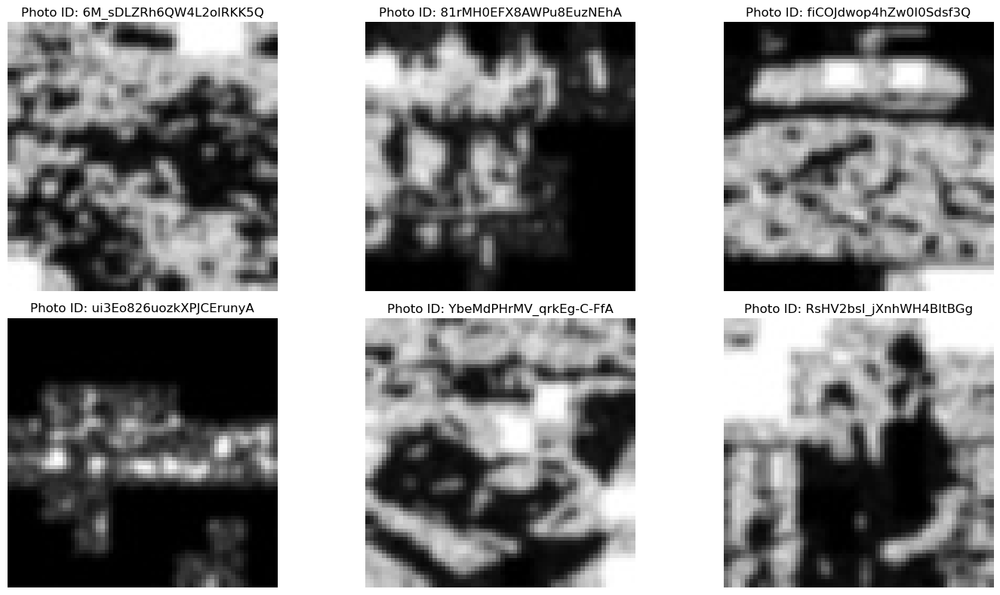

In [14]:
import os
import cv2
import matplotlib.pyplot as plt

# Folder where blurred images are stored
blurred_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder'

# Set up plot for displaying 6 images
plt.figure(figsize=(15, 8))  # Adjust size as needed

# Show first 6 images from the list
for i, entry in enumerate(sampled_data_list[:6]):
    photo_id = entry['photo_id']
    img_path = os.path.join(blurred_folder, photo_id + '_blurred.jpg')

    # Load image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    if img is not None:
        plt.subplot(2, 3, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Photo ID: {photo_id}")
        plt.axis('off')
    else:
        print(f"Could not load image: {img_path}")

plt.tight_layout()
plt.show()


Preparing the initial requirements which include importing all the mandatory libraries. The script is prepared for tasks like data loading, preprocessing, model definition, training with techniques like stratified k-fold cross-validation, and evaluation using metrics such as confusion matrices and ROC AUC scores. It also includes tools for visualization (matplotlib, seaborn).

In [15]:
# installing required libraries
import numpy as np
import os
import cv2
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import seaborn as sns

In [16]:
# --- Load your label data ---
photos_json_path = "C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp-Photos/Yelp Photos/yelp_photos/photos.json"
photos_df = pd.read_json(photos_json_path, lines=True)

In [17]:
# --- Use 50% of the data for better results ---
from sklearn.model_selection import train_test_split
sampled_data_list, _ = train_test_split(photos_df, test_size=0.5, stratify=photos_df['label'])
sampled_data_list = sampled_data_list[['photo_id']].to_dict(orient='records')

This piece of code used your preprocessed images i.e. blurred images and their corresponding labels, and converts the images into normalized array suitable for neural network operations where the labels are encocoded and converted into one hot vectors. This prepares the dataset (X,y,y_cat) for training the DNN model 

In [18]:
# --- Prepare data and labels ---
blurred_folder = 'C:/Users/GINE/OneDrive - Loyalist College/Documents/AI&DS/term3/AISC2008 - Computer Vision 01/dataset/Yelp Photos/yelp_photos/blurred_folder'
label_map = {label: idx for idx, label in enumerate(photos_df['label'].unique())}
X, y = [], []
for entry in sampled_data_list:
    photo_id = entry['photo_id']
    img_path = os.path.join(blurred_folder, photo_id + '_blurred.jpg')
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is not None:
        X.append(img)
        label = photos_df.loc[photos_df['photo_id'] == photo_id, 'label'].values[0]
        y.append(label_map[label])

X = np.array(X, dtype='float32') / 255.0
X = X[..., np.newaxis]  # Add channel dimension
y = np.array(y)
num_classes = len(label_map)
y_cat = to_categorical(y, num_classes)

This piece of code sets up a 5-fold stratified cross-validation loop for training and evaluating the  DNN. For each fold, it splits the data into training and testing sets while preserving the class distribution, converts the labels to one-hot encoded vectors for NN training, and stores the true labels for later evaluation.

In [19]:
# --- DNN with Cross-Validation ---
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_y_true = []
all_y_pred = []
all_y_prob = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
    print(f"\n--- Fold {fold+1} ---")
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = to_categorical(y[train_idx], num_classes), to_categorical(y[test_idx], num_classes)
    y_test_labels = y[test_idx]


--- Fold 1 ---

--- Fold 2 ---

--- Fold 3 ---

--- Fold 4 ---

--- Fold 5 ---


This piece of code defines and trains a deep, regularized DNN model for image classification. The model uses multiple dense layers with ReLU activation, batch normalization, and dropout to prevent overfitting. It is compiled with the Adam optimizer and categorical cross-entropy loss. Training uses early stopping and learning rate reduction callbacks for optimal performance. After training, the model predicts class probabilities and labels for the test set, and the results are collected for later evaluation across all cross-validation folds.

In [20]:
# DNN Model: Well-tuned, deep, regularized
model = Sequential([
        Flatten(input_shape=X_train.shape[1:]),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.4),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

callbacks = [
        EarlyStopping(patience=6, restore_best_weights=True, monitor='val_loss'),
        ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss')
    ]

model.fit(X_train, y_train, epochs=40, batch_size=32, validation_split=0.15, callbacks=callbacks, verbose=1)

y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

all_y_true.extend(y_test_labels)
all_y_pred.extend(y_pred)
all_y_prob.extend(y_pred_prob)

C:\Users\GINE\anaconda3\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - accuracy: 0.5497 - loss: 1.3530 - val_accuracy: 0.6526 - val_loss: 0.9686 - learning_rate: 0.0010
Epoch 2/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.6321 - loss: 1.0351 - val_accuracy: 0.6627 - val_loss: 0.9328 - learning_rate: 0.0010
Epoch 3/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.6378 - loss: 1.0007 - val_accuracy: 0.6596 - val_loss: 0.9340 - learning_rate: 0.0010
Epoch 4/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.6600 - loss: 0.9388 - val_accuracy: 0.6737 - val_loss: 0.9282 - learning_rate: 0.0010
Epoch 5/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.6533 - loss: 0.9545 - val_accuracy: 0.6645 - val_loss: 0.9271 - learning_rate: 0.0010
Epoch 6/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.6580 - loss: 0.9520 - val_accuracy: 0.6689 - val_loss: 0.9220 - learning_rate: 0.0010
Epoch 7/40
404/404 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6576 - loss: 

The code which is been evaluated is visualized and the preofmrnace of the DNN model is mentioned after 5-fold cross validation. the visualization is displayed in the form of confusion matrix heatmapt to show how well the model differentiate between different classes and prints the detailed classification report along with the macro- average AUC score to display overall model discrimination 

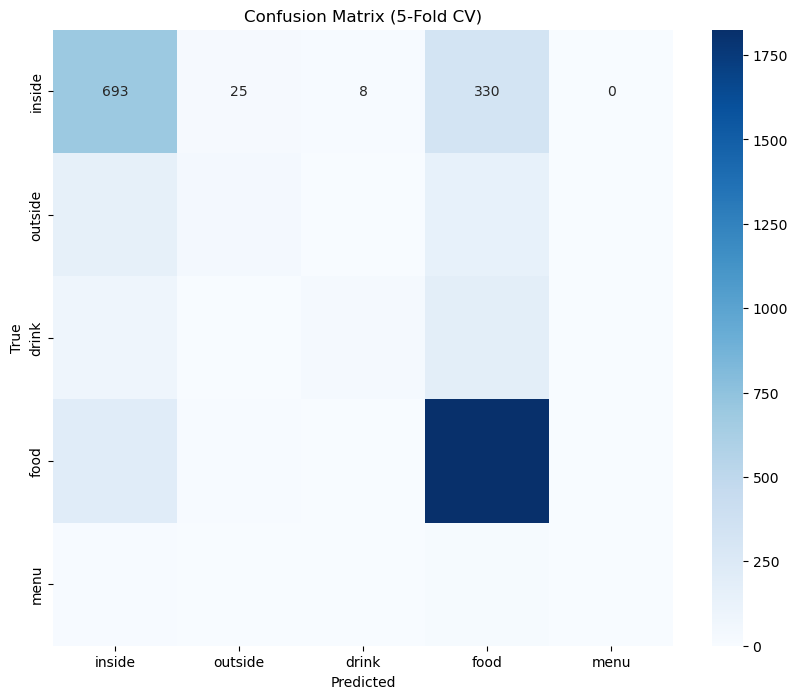

              precision    recall  f1-score   support

      inside       0.60      0.66      0.62      1056
     outside       0.48      0.12      0.19       348
       drink       0.71      0.10      0.17       304
        food       0.73      0.89      0.80      2054
        menu       1.00      0.03      0.06        31

    accuracy                           0.68      3793
   macro avg       0.70      0.36      0.37      3793
weighted avg       0.67      0.68      0.64      3793

Macro-average AUC: 0.7853


In [21]:
# --- Evaluation ---
cm = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_map.keys(), yticklabels=label_map.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (5-Fold CV)')
plt.show()

print(classification_report(all_y_true, all_y_pred, target_names=label_map.keys()))

try:
    auc = roc_auc_score(to_categorical(all_y_true, num_classes), np.array(all_y_prob), multi_class='ovr')
    print(f"Macro-average AUC: {auc:.4f}")
except Exception as e:
    print("AUC calculation error:", e)

Class accuracy is 68%,
food: Highest performance (precision 0.73, recall 0.87, f1-score 0.79), indicating the model is best at identifying food images.
outside and drink: Low recall (0.20 and 0.09), meaning the model misses many true samples of these classes, though precision for drink is high (0.79), indicating that when it predicts drink, it's usually correct, but it rarely does so.
menu: Very low support (only 18 samples), with low precision and recall, so the model struggles with this class.
Macro-average AUC: 0.7937. This indicates good overall discrimination between classes, even if recall is low for some.

This code uses smoothed class weights and data augmentation in a 5-fold cross-validation loop to train a regularized DNN, helping to address class imbalance and improve generalization.
this is done to avoid over compensating for minority classes, defines a deep regularized DNN with batch normalization and dropouts layers to prevent over fitting

In [22]:
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Compute class weights and smooth them (to avoid overcompensation)
raw_class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y),
    y=y
)
# Smoothing: blend with 1.0 (no weighting) to reduce overfitting to minority classes
smooth_factor = 0.7
class_weights = raw_class_weights * smooth_factor + (1 - smooth_factor) * 1.0
class_weight_dict = dict(enumerate(class_weights))

# Data augmentation for grayscale images
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_y_true = []
all_y_pred = []
all_y_prob = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
    print(f"\n--- Fold {fold+1} ---")
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = to_categorical(y[train_idx], num_classes), to_categorical(y[test_idx], num_classes)
    y_test_labels = y[test_idx]

    model = Sequential([
        Input(shape=X_train.shape[1:]),
        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.6),  # Slightly higher dropout for more regularization
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.4),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    callbacks = [
        EarlyStopping(patience=8, restore_best_weights=True, monitor='val_loss'),
        ReduceLROnPlateau(patience=4, factor=0.5, monitor='val_loss')
    ]


--- Fold 1 ---

--- Fold 2 ---

--- Fold 3 ---

--- Fold 4 ---

--- Fold 5 ---


Few points have been mentioned earlier, It also uses the Adam optimizer and categorical cross-entropy loss. Early stopping and learning rate reduction callbacks are included for efficient training and better generalization.

In [23]:
# DNN Model: Well-tuned, deep, regularized
model = Sequential([
        Input(shape=X_train.shape[1:]),
        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.4),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

callbacks = [
        EarlyStopping(patience=6, restore_best_weights=True, monitor='val_loss'),
        ReduceLROnPlateau(patience=3, factor=0.5, monitor='val_loss')
    ]

In [24]:
import tensorflow as tf

# Convert to tf.data.Dataset
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=1000).batch(32).prefetch(tf.data.AUTOTUNE)

model.fit(
    train_dataset,
    epochs=50,
    validation_data=(X_test, y_test),
    callbacks=callbacks,
    verbose=1,
    class_weight=class_weight_dict
)

Epoch 1/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - accuracy: 0.3827 - loss: 1.9745 - val_accuracy: 0.6211 - val_loss: 1.1068 - learning_rate: 0.0010
Epoch 2/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.4786 - loss: 1.5191 - val_accuracy: 0.6059 - val_loss: 1.1401 - learning_rate: 0.0010
Epoch 3/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.5178 - loss: 1.4134 - val_accuracy: 0.5534 - val_loss: 1.2303 - learning_rate: 0.0010
Epoch 4/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.5423 - loss: 1.3697 - val_accuracy: 0.5977 - val_loss: 1.1264 - learning_rate: 0.0010
Epoch 5/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5548 - loss: 1.3103 - val_accuracy: 0.5755 - val_loss: 1.1565 - learning_rate: 5.0000e-04
Epoch 6/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5518 - loss: 1.2916 - val_accuracy: 0.5927 - val_loss: 1.1085 - learning_rate: 5.0000e-04
Epoch 7/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.5762 -

In [35]:
import numpy as np

print("Type:", type(all_y_prob))
print("Length:", len(all_y_prob))

if len(all_y_prob) > 0:
    print("Shape of first element:", np.array(all_y_prob[0]).shape)
else:
    print("all_y_prob is EMPTY!")


Type: <class 'list'>
Length: 0
all_y_prob is EMPTY!


In [36]:
all_y_prob = np.array(all_y_prob)

print("all_y_prob.shape:", all_y_prob.shape)


all_y_prob.shape: (0,)


In [38]:
all_y_true = []
all_y_pred = []
all_y_prob = []

In [39]:
y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

all_y_true.extend(y_test_labels)     
all_y_pred.extend(y_pred)            
all_y_prob.extend(y_pred_prob)       


119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


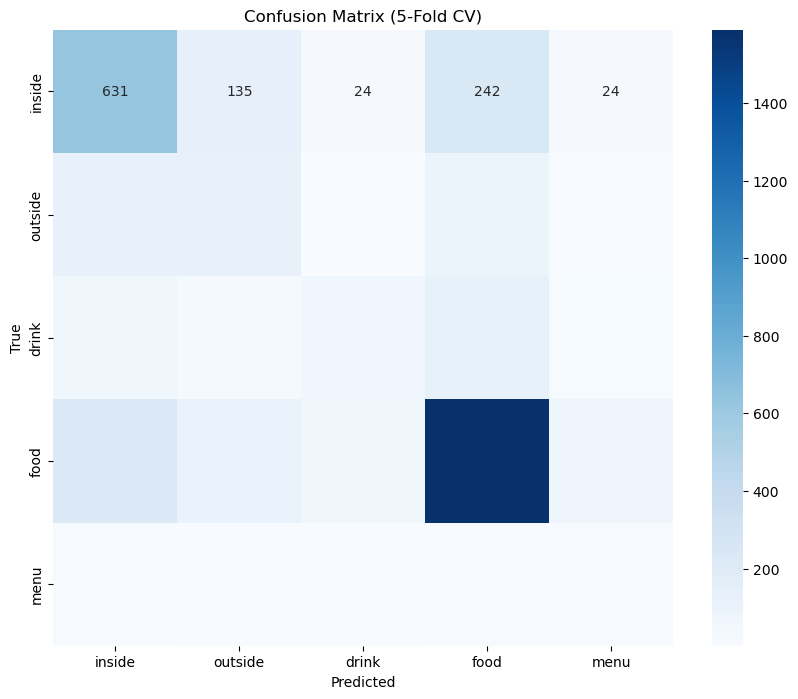

              precision    recall  f1-score   support

      inside       0.59      0.60      0.60      1056
     outside       0.31      0.34      0.32       348
       drink       0.38      0.20      0.26       304
        food       0.77      0.77      0.77      2054
        menu       0.08      0.32      0.13        31

    accuracy                           0.64      3793
   macro avg       0.43      0.45      0.42      3793
weighted avg       0.64      0.64      0.64      3793

Macro-average AUC: 0.7660


In [42]:
# --- Evaluation ---
cm = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_map.keys(), yticklabels=label_map.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (5-Fold CV)')
plt.show()

print(classification_report(all_y_true, all_y_pred, target_names=label_map.keys()))

try:
    auc = roc_auc_score(to_categorical(all_y_true, num_classes), np.array(all_y_prob), multi_class='ovr')
    print(f"Macro-average AUC: {auc:.4f}")
except Exception as e:
    print("AUC calculation error:", e)

Class accuracy is 64%,drink: Very low recall (0.10) and f1-score (0.15), meaning the model rarely identifies this class correctly. Macro-average AUC: 0.7609. The model has moderate ability to distinguish between classes overall.
The model performs poorly on minority classes (outside, drink, menu), with low precision, recall, and f1-scores for these.

## Class Separability Analysis

Epoch 1/3
475/475 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5509 - loss: 1.2291 - val_accuracy: 0.6544 - val_loss: 1.0211
Epoch 2/3
475/475 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.6155 - loss: 1.0375 - val_accuracy: 0.6512 - val_loss: 1.0140
Epoch 3/3
475/475 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.6462 - loss: 0.9915 - val_accuracy: 0.6554 - val_loss: 0.9881
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


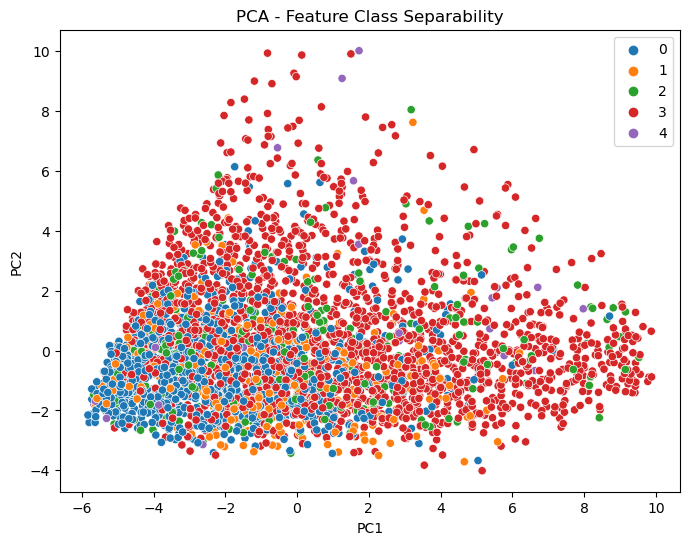

Silhouette Score: -0.0562


In [43]:
# Imports
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Functional API model (solves all .input issues)
input_layer = Input(shape=X_train.shape[1:])
x = Flatten()(input_layer)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(128, activation='relu')(x)
output_layer = Dense(y_train.shape[1], activation='softmax')(x)

model = Model(inputs=input_layer, outputs=output_layer)

# Compile and train
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=3, batch_size=32)

# Extract penultimate features
penultimate_model = Model(inputs=model.input, outputs=model.layers[-2].output)
X_features = penultimate_model.predict(X_test)
y_labels = np.argmax(y_test, axis=1)

# PCA and plot
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_features)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y_labels, palette='tab10')
plt.title("PCA - Feature Class Separability")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Silhouette score
score = silhouette_score(X_pca, y_labels)
print(f"Silhouette Score: {score:.4f}")


## LIME for Local Interpretability

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━

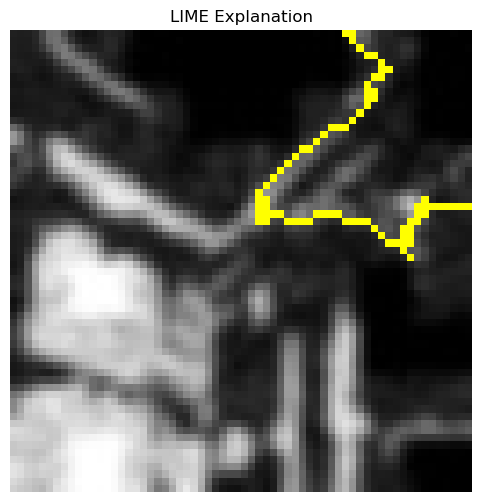

In [44]:
# Install lime if needed
!pip install -q lime

import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Define a flexible prediction function for LIME
def predict_fn(images):
    images = images.astype('float32') / 255.0  # normalize to match model input

    # Handle flattened models (e.g., input_shape = (4096,))
    if len(model.input_shape) == 2 and model.input_shape[1] == np.prod(images.shape[1:]):
        images = images.reshape((images.shape[0], -1))

    # Handle grayscale models (e.g., input_shape = (64, 64, 1))
    elif model.input_shape[-1] == 1:
        images = np.mean(images, axis=-1, keepdims=True)

    return model.predict(images)

# Initialize LIME explainer
explainer = lime_image.LimeImageExplainer()

# Choose one image from X_test
idx = 0
image = X_test[idx]

# Ensure 3-channel (RGB) format
if image.ndim == 2:
    image = np.stack([image] * 3, axis=-1)
elif image.shape[-1] == 1:
    image = np.concatenate([image] * 3, axis=-1)
elif image.shape[-1] != 3:
    raise ValueError(f"Unsupported image shape: {image.shape}")

# Convert image to uint8 in case it's normalized
if image.max() <= 1.0:
    image = (image * 255).astype('uint8')
else:
    image = image.astype('uint8')

# Explain the prediction
explanation = explainer.explain_instance(
    image=image,
    classifier_fn=predict_fn,
    top_labels=1,
    hide_color=0,
    num_samples=1000
)

# Visualize the LIME explanation
temp, mask = explanation.get_image_and_mask(
    label=explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)

plt.figure(figsize=(6, 6))
plt.imshow(mark_boundaries(temp / 255.0, mask))
plt.title("LIME Explanation")
plt.axis('off')
plt.show()


## Model Performance Evaluation

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Labels in y_test:      [0 1 2 3 4]
Labels predicted:      [0 1 2 3]
              precision    recall  f1-score   support

           0       0.54      0.71      0.61      1056
           1       0.49      0.12      0.19       348
           2       0.75      0.06      0.11       304
           3       0.73      0.82      0.77      2054
           4       0.00      0.00      0.00        31

    accuracy                           0.66      3793
   macro avg       0.50      0.34      0.34      3793
weighted avg       0.65      0.66      0.61      3793



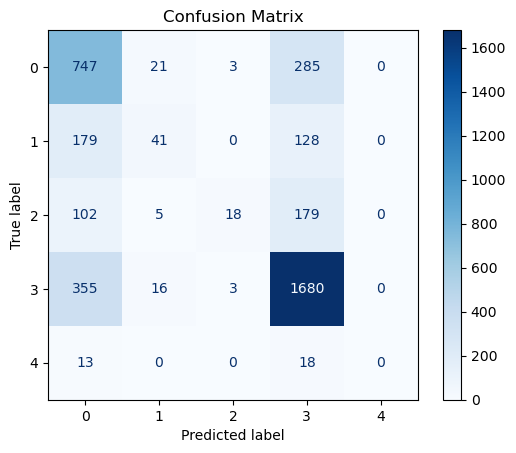

In [45]:
# --- Model Performance Evaluation (Fixed) ---
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Predict on test data
y_pred = np.argmax(model.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)

# Show what labels were predicted
print("Labels in y_test:     ", np.unique(y_true))
print("Labels predicted:     ", np.unique(y_pred))

# Classification report with safe fallback
print(classification_report(y_true, y_pred, zero_division=0))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()


## Empirical Tuning Round 1

In [46]:
# --- Empirical Tuning Round 1 (Fixed) ---
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam

# Split X_train into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

# Get input shape from training data
input_shape = X_train.shape[1:]  # e.g., (64, 64, 3)

# Define model
model = Sequential([
    Flatten(input_shape=input_shape),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dense(y_train.shape[1], activation='softmax')  # number of classes
])

# Compile with Adam optimizer
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)


Epoch 1/10


C:\Users\GINE\anaconda3\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5535 - loss: 1.2436 - val_accuracy: 0.6079 - val_loss: 1.0694
Epoch 2/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6162 - loss: 1.0443 - val_accuracy: 0.6132 - val_loss: 1.0626
Epoch 3/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6350 - loss: 0.9979 - val_accuracy: 0.6155 - val_loss: 1.0743
Epoch 4/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6441 - loss: 0.9817 - val_accuracy: 0.6498 - val_loss: 0.9988
Epoch 5/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6399 - loss: 0.9898 - val_accuracy: 0.6191 - val_loss: 1.0258
Epoch 6/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6487 - loss: 0.9613 - val_accuracy: 0.6056 - val_loss: 1.0447
Epoch 7/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.6606 - loss: 0.9497 - val_accuracy: 0.6181 - val_loss: 1.0314
Epoch 8/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6662 - loss: 0.9353 - val_accuracy: 0.6158 - val_

## Empirical Tuning Round 2

In [47]:
# --- Empirical Tuning Round 2 ---
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Resplit training and validation sets (optional, or reuse previous split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

# Get input shape from training data
input_shape = X_train.shape[1:]

# Define modified model (deeper, with extra Dropout)
model = Sequential([
    Flatten(input_shape=input_shape),
    Dense(512, activation='relu'),
    Dropout(0.4),                      # Increased dropout
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dense(y_train.shape[1], activation='softmax')
])

# Compile with slightly lower learning rate
optimizer = Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)


Epoch 1/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.5217 - loss: 1.2435 - val_accuracy: 0.6199 - val_loss: 1.0738
Epoch 2/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.6076 - loss: 1.0689 - val_accuracy: 0.6479 - val_loss: 1.0222
Epoch 3/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.6140 - loss: 1.0456 - val_accuracy: 0.6450 - val_loss: 0.9929
Epoch 4/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.6276 - loss: 1.0089 - val_accuracy: 0.6479 - val_loss: 1.0048
Epoch 5/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.6406 - loss: 0.9937 - val_accuracy: 0.5420 - val_loss: 1.0838
Epoch 6/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.6415 - loss: 0.9840 - val_accuracy: 0.6256 - val_loss: 1.0208
Epoch 7/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.6517 - loss: 0.9632 - val_accuracy: 0.5815 - val_loss: 1.0523
Epoch 8/10
304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.6527 - loss: 0.9723 - val_acc

## 🔁 Empirical Tuning Round 3

In [48]:
# --- Empirical Tuning Round 3 ---
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Resplit training and validation sets (optional, or reuse previous split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

# Get input shape from training data
input_shape = X_train.shape[1:]

# Define modified model (same depth as Round 2)
model = Sequential([
    Flatten(input_shape=input_shape),
    Dense(512, activation='relu'),
    Dropout(0.4),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dense(y_train.shape[1], activation='softmax')
])

# Compile with SGD optimizer and momentum
optimizer = SGD(learning_rate=0.01, momentum=0.9)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Setup EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train model
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    callbacks=[early_stop]
)


Epoch 1/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.5637 - loss: 1.1758 - val_accuracy: 0.6444 - val_loss: 1.0684
Epoch 2/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6313 - loss: 1.0393 - val_accuracy: 0.6001 - val_loss: 1.0599
Epoch 3/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6176 - loss: 1.0513 - val_accuracy: 0.6104 - val_loss: 1.0322
Epoch 4/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6364 - loss: 0.9990 - val_accuracy: 0.6511 - val_loss: 1.0095
Epoch 5/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6429 - loss: 0.9899 - val_accuracy: 0.5054 - val_loss: 1.1296
Epoch 6/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6502 - loss: 0.9794 - val_accuracy: 0.5358 - val_loss: 1.1013
Epoch 7/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6455 - loss: 0.9744 - val_accuracy: 0.6294 - val_loss: 1.0060
Epoch 8/20
243/243 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6446 - loss: 0.9706 - val_accuracy: 0